In [1]:
from IPython.display import display, HTML, Image
display(HTML("<style>.container { width:95% !important; }</style>"))

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore")

import os
import copy

import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
from anndata import AnnData

import matplotlib
from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

import sys
sys.path.append("../../lib")
from stpalette import palette_WM4007_rna, palette_WM4237_rna
from plots import plotSpatialAll, plotSpatialEdge, euclidean_p1
from cheatmap import sMED, cdist, cplot
from utils import loadAdImage, filterCNV

In [2]:
model = 'WM4007'
palette_rna = palette_WM4007_rna if model=='WM4007' else palette_WM4237_rna

In [3]:
preprocessedStDataPath = 'd:/from HPCC 11 28 2022/results_NF1-nod-t2t-k35/%s/' % model
dataPath = '../../data/'
ids = sorted(np.loadtxt(dataPath + 'ids_%s_ST.txt' % model, dtype=str))
sids = [id[7:12] for id in ids]
ids

['WM4007_T0_S1_ST',
 'WM4007_T0_S2_ST',
 'WM4007_T1_S1_ST',
 'WM4007_T1_S2_ST',
 'WM4007_T2_S1_ST',
 'WM4007_T2_S2_ST',
 'WM4007_T3_S1_ST',
 'WM4007_T3_S2_ST',
 'WM4007_T4_S1_ST',
 'WM4007_T4_S2_ST',
 'WM4007_TC_S1_ST',
 'WM4007_TC_S2_ST']

In [5]:
from scipy.spatial.distance import cdist, pdist, squareform

In [7]:
ad_all = sc.read(dataPath + 'ad_all_human_clustered_st_%s.h5ad' % model)
ad_all = ad_all[ad_all.obs['human_ratio']>=0.25]
filter_spots_index = ad_all.obs.index.copy()
# ad_all.X = None
filter_spots_index

Index(['AAACAAGTATCTCCCA-1-WM4007_TC_S1_ST',
       'AAACATTTCCCGGATT-1-WM4007_TC_S1_ST',
       'AAACCGGGTAGGTACC-1-WM4007_TC_S1_ST',
       'AAACCGTTCGTCCAGG-1-WM4007_TC_S1_ST',
       'AAACCTAAGCAGCCGG-1-WM4007_TC_S1_ST',
       'AAACGAGACGGTTGAT-1-WM4007_TC_S1_ST',
       'AAACGCTGGGCACGAC-1-WM4007_TC_S1_ST',
       'AAACGGGCGTACGGGT-1-WM4007_TC_S1_ST',
       'AAACGGTTGCGAACTG-1-WM4007_TC_S1_ST',
       'AAACTCGGTTCGCAAT-1-WM4007_TC_S1_ST',
       ...
       'TTGGGACACTGCCCGC-1-WM4007_T4_S2_ST',
       'TTGGGCGGCGGTTGCC-1-WM4007_T4_S2_ST',
       'TTGTAAGGCCAGTTGG-1-WM4007_T4_S2_ST',
       'TTGTCGTTCAGTTACC-1-WM4007_T4_S2_ST',
       'TTGTGTATGCCACCAA-1-WM4007_T4_S2_ST',
       'TTGTGTTTCCCGAAAG-1-WM4007_T4_S2_ST',
       'TTGTTAGCAAATTCGA-1-WM4007_T4_S2_ST',
       'TTGTTCAGTGTGCTAC-1-WM4007_T4_S2_ST',
       'TTGTTGTGTGTCAAGA-1-WM4007_T4_S2_ST',
       'TTGTTTCACATCCAGG-1-WM4007_T4_S2_ST'],
      dtype='object', length=10843)

In [10]:
ad_cnv = sc.read(dataPath + 'ad_all_human_clustered_cnv_%s.h5ad' % model)
ad_cnv = ad_cnv[ad_cnv.obs.index.intersection(filter_spots_index), :]
ad_cnv

View of AnnData object with n_obs × n_vars = 10835 × 8625
    obs: 'sample', 'cluster', 'time', 'original_barcode', 'id', 'cnv_clusters'
    uns: 'cluster_colors', 'cnv_clusters_colors', 'leiden', 'neighbors', 'pca', 'sample_colors', 'time_colors', 'umap'
    obsm: 'X_palantir', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

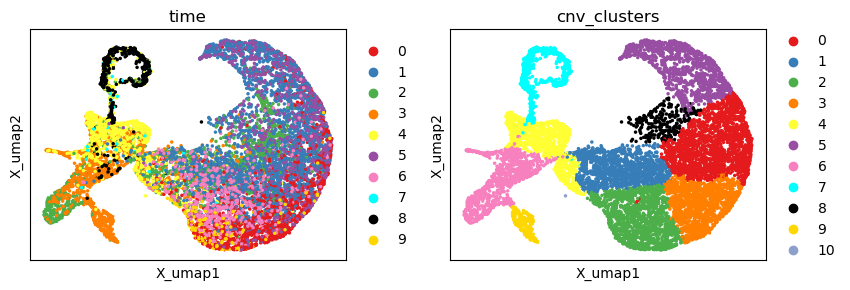

In [11]:
plt.rcParams["figure.figsize"] = (4, 3)
sc.pl.embedding(ad_cnv[ad_cnv.obs.index.intersection(filter_spots_index), :], color=['cluster', 'cnv_clusters'], basis="X_umap", title='time', palette=palette_rna, size=25)

In [15]:
dfc = ad_cnv.obs[['cnv_clusters', 'sample']].value_counts().unstack().fillna(0).astype(int)
dfc

sample,T0_S1,T0_S2,T1_S1,T1_S2,T2_S1,T2_S2,T3_S1,T3_S2,T4_S1,T4_S2,TC_S1,TC_S2
cnv_clusters,,,,,,,,,,,,
0,508,410,145,140,0,0,0,2,2,0,364,380
1,32,29,314,295,3,2,7,31,8,13,216,307
2,327,221,122,102,2,1,0,2,2,2,332,392
3,413,383,37,27,0,0,0,0,0,0,299,234
4,1,0,262,387,20,25,212,120,59,54,19,16
5,197,136,49,40,0,0,0,0,0,0,301,472
6,0,0,5,9,1,0,65,66,389,553,3,8
7,0,0,0,2,3,1,12,7,353,371,0,0
8,99,29,27,23,0,0,0,0,0,1,46,34


In [16]:
dfc.loc[['0', '3', '5']]

sample,T0_S1,T0_S2,T1_S1,T1_S2,T2_S1,T2_S2,T3_S1,T3_S2,T4_S1,T4_S2,TC_S1,TC_S2
cnv_clusters,,,,,,,,,,,,
0,508,410,145,140,0,0,0,2,2,0,364,380
3,413,383,37,27,0,0,0,0,0,0,299,234
5,197,136,49,40,0,0,0,0,0,0,301,472


In [17]:
dfc.loc[['1', '4', '6', '7', '8', '9']]

sample,T0_S1,T0_S2,T1_S1,T1_S2,T2_S1,T2_S2,T3_S1,T3_S2,T4_S1,T4_S2,TC_S1,TC_S2
cnv_clusters,,,,,,,,,,,,
1,32,29,314,295,3,2,7,31,8,13,216,307
4,1,0,262,387,20,25,212,120,59,54,19,16
6,0,0,5,9,1,0,65,66,389,553,3,8
7,0,0,0,2,3,1,12,7,353,371,0,0
8,99,29,27,23,0,0,0,0,0,1,46,34
9,0,0,0,0,0,0,0,0,74,177,0,0


# ???

In [59]:
use_raw_distances = False
metric = 'cosine'

if use_raw_distances:
    df_cnv = ad_cnv.to_df()
    df_cnv.index = ad_cnv.obs['cnv_clusters']
else:
    df_cnv = pd.DataFrame(ad_cnv.obsm['X_pca'], index=ad_cnv.obs['cnv_clusters'])
    
uclusters = list(ad_cnv.obs['cnv_clusters'].unique())

res = dict()
for c1 in uclusters:
    for c2 in uclusters:
        if (c1!=c2) and (not (c1, c2) in res.keys()) and (not (c2, c1) in res.keys()):
            print(c1, '\t', c2, '\t', df_cnv.loc[c1].shape[0], df_cnv.loc[c2].shape[0])
            d = cdist(df_cnv.loc[c1], df_cnv.loc[c2], metric=metric).mean() # euclidean cosine
            res.update({(c1, c2): d})
df_pdist = pd.Series(res).unstack()
df_ppdist = df_pdist.reindex(uclusters).T.reindex(uclusters).fillna(0.) + df_pdist.reindex(uclusters).T.reindex(uclusters).T.fillna(0.)

3 	 2 	 1398 1526
3 	 0 	 1398 2020
3 	 1 	 1398 1558
3 	 5 	 1398 1216
3 	 4 	 1398 1275
3 	 8 	 1398 630
3 	 6 	 1398 1158
3 	 7 	 1398 841
3 	 9 	 1398 255
3 	 10 	 1398 58
2 	 0 	 1526 2020
2 	 1 	 1526 1558
2 	 5 	 1526 1216
2 	 4 	 1526 1275
2 	 8 	 1526 630
2 	 6 	 1526 1158
2 	 7 	 1526 841
2 	 9 	 1526 255
2 	 10 	 1526 58
0 	 1 	 2020 1558
0 	 5 	 2020 1216
0 	 4 	 2020 1275
0 	 8 	 2020 630
0 	 6 	 2020 1158
0 	 7 	 2020 841
0 	 9 	 2020 255
0 	 10 	 2020 58
1 	 5 	 1558 1216
1 	 4 	 1558 1275
1 	 8 	 1558 630
1 	 6 	 1558 1158
1 	 7 	 1558 841
1 	 9 	 1558 255
1 	 10 	 1558 58
5 	 4 	 1216 1275
5 	 8 	 1216 630
5 	 6 	 1216 1158
5 	 7 	 1216 841
5 	 9 	 1216 255
5 	 10 	 1216 58
4 	 8 	 1275 630
4 	 6 	 1275 1158
4 	 7 	 1275 841
4 	 9 	 1275 255
4 	 10 	 1275 58
8 	 6 	 630 1158
8 	 7 	 630 841
8 	 9 	 630 255
8 	 10 	 630 58
6 	 7 	 1158 841
6 	 9 	 1158 255
6 	 10 	 1158 58
7 	 9 	 841 255
7 	 10 	 841 58
9 	 10 	 255 58


In [60]:
df_ppdist = df_pdist.reindex(uclusters).T.reindex(uclusters).fillna(0.) + df_pdist.reindex(uclusters).T.reindex(uclusters).T.fillna(0.)
df_styled = df_ppdist.style.background_gradient(axis=None, vmin=df_ppdist[df_ppdist!=0].min().min(), cmap='bwr')
df_styled.to_excel(f'{model}_PCA_cosine_distance_average_over_cnv_clusters.xlsx')
df_styled

,3,2,0,1,5,4,8,6,7,9,10
3,0.000000,0.927094,0.923703,1.012553,0.927642,1.072228,1.001883,1.093281,1.090271,1.087511,1.055335
2,0.927094,0.000000,0.984570,1.011484,1.018919,0.959513,1.104986,1.058200,1.039243,1.098684,1.024781
0,0.923703,0.984570,0.000000,1.019498,0.842658,1.137494,0.922144,1.114337,1.088537,1.083891,1.083337
1,1.012553,1.011484,1.019498,0.000000,1.064657,0.984456,0.976176,0.955664,1.039887,0.945516,0.984125
5,0.927642,1.018919,0.842658,1.064657,0.000000,1.203314,0.872657,1.199887,1.060749,1.163015,1.097410
4,1.072228,0.959513,1.137494,0.984456,1.203314,0.000000,1.186253,0.911452,0.908853,1.000013,0.893590
8,1.001883,1.104986,0.922144,0.976176,0.872657,1.186253,0.000000,1.031964,1.094808,0.930099,1.018331
6,1.093281,1.058200,1.114337,0.955664,1.199887,0.911452,1.031964,0.000000,0.985230,0.710771,0.999607
7,1.090271,1.039243,1.088537,1.039887,1.060749,0.908853,1.094808,0.985230,0.000000,1.079929,0.955386
9,1.087511,1.098684,1.083891,0.945516,1.163015,1.000013,0.930099,0.710771,1.079929,0.000000,1.086725


# Load spatial

In [25]:
images = {id: [(ad_temp := sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id)).uns['spatial'], ad_temp.obs.index, ad_temp.obsm['spatial']] for id in ids}

In [26]:
ads = dict()
for sample in ids:
    print(sample, end='\t')
    ads[sample] = ad_cnv[ad_cnv.obs['id']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample][0]
    ads[sample].obsm['spatial'] = pd.DataFrame(index=images[sample][1], data=images[sample][2]).reindex(ads[sample].obs['original_barcode']).values
    ads[sample][:, :] = filterCNV(ads[sample].to_df().T, n=10).T

WM4007_T0_S1_ST	WM4007_T0_S2_ST	WM4007_T1_S1_ST	WM4007_T1_S2_ST	WM4007_T2_S1_ST	WM4007_T2_S2_ST	WM4007_T3_S1_ST	WM4007_T3_S2_ST	WM4007_T4_S1_ST	WM4007_T4_S2_ST	WM4007_TC_S1_ST	WM4007_TC_S2_ST	

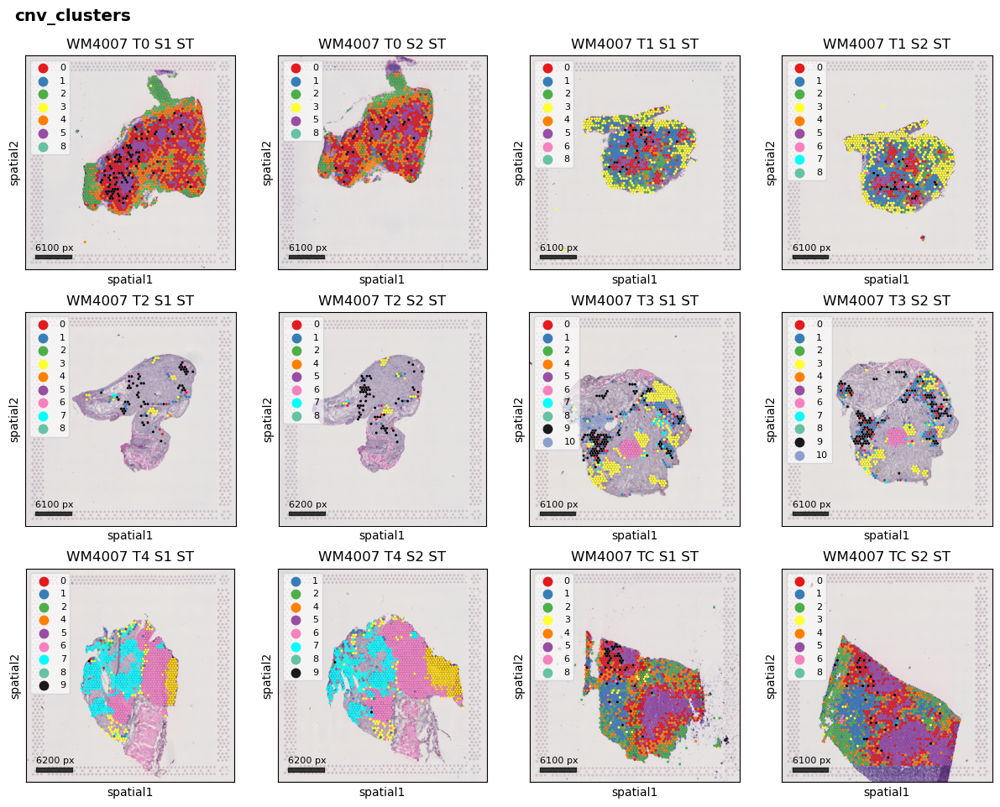

In [27]:
plotSpatialAll(ads, identity='cnv_clusters', palette=palette_rna, f=0.75)

In [10]:
# params = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=1, absolute_cutoff=60., R=1,
#               alpha_quantile=0.75, method='cosine', key_added='cnv_cosine_distance', cacheEdges=True, useSavedCache=False) # MED, pearson, euclidean

# plotSpatialEdge(ads, identity='cluster', palette=palette_rna, f=0.2, invert=False, use_raw_distances=False, noplot=True, **params)

In [12]:
# plotSpatialAll({id: ads[id] for id in ids if not '_TE_' in id}, identity='cnv_cosine_distance', palette=palette_rna, f=0.6, cmap='nipy_spectral', uniformColorScale=True, wspace=0.3)

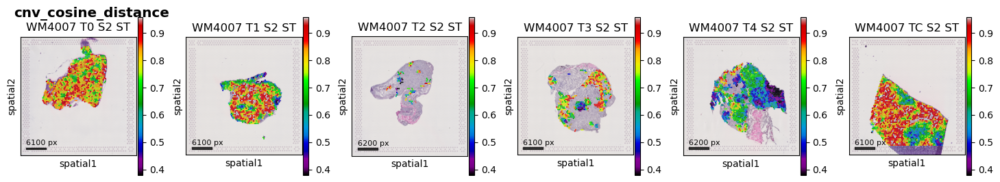

In [11]:
plotSpatialAll({id: ads[id] for id in ids if not '_TE_' in id and '_S2_' in id}, identity='cnv_cosine_distance', palette=palette_rna, nx=6, f=0.6, cmap='nipy_spectral', uniformColorScale=True, wspace=0.3)

In [11]:
# params = dict(fontsize=12, markerscale=1.5, linewidth_factor=2.0, alpha=0.25, alpha_img=0.25, decay_power=4, absolute_cutoff=0.7, R=1, # 20
#               alpha_quantile=0.75, method='cosine', cacheEdges=False, useSavedCache=False)

# res=plotSpatialEdge({id: ads[id] for id in ids if not '_TE_' in id}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=True, noplot=False, **params)
# # res=plotSpatialEdge({(id:='WM4237_T4_S1_ST'): ads['WM4237_T4_S1_ST']}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)

WM4007_T0_S1_ST	WM4007_T0_S2_ST	WM4007_T1_S1_ST	WM4007_T1_S2_ST	WM4007_T2_S1_ST	WM4007_T2_S2_ST	WM4007_T3_S1_ST	WM4007_T3_S2_ST	WM4007_T4_S1_ST	WM4007_T4_S2_ST	WM4007_TC_S1_ST	WM4007_TC_S2_ST	

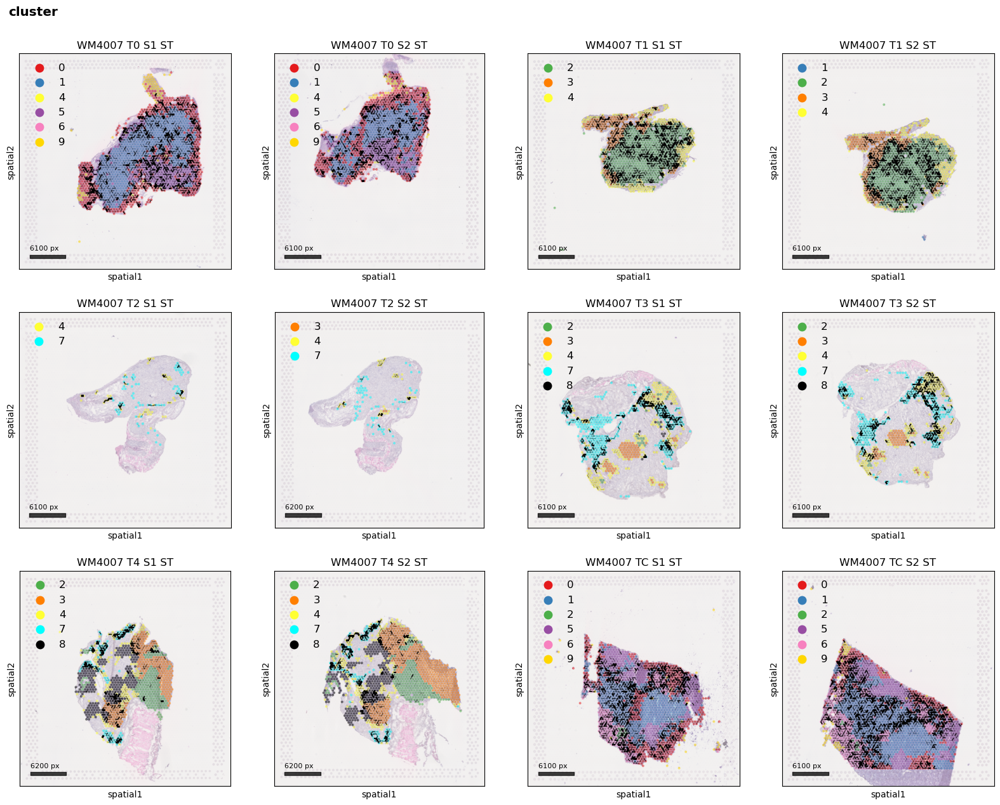

In [13]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=2.0, alpha=0.5, alpha_img=0.5, decay_power=4, absolute_cutoff=None, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if not '_TE_' in id}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)

WM4007_T0_S1_ST	WM4007_T1_S1_ST	WM4007_TC_S2_ST	

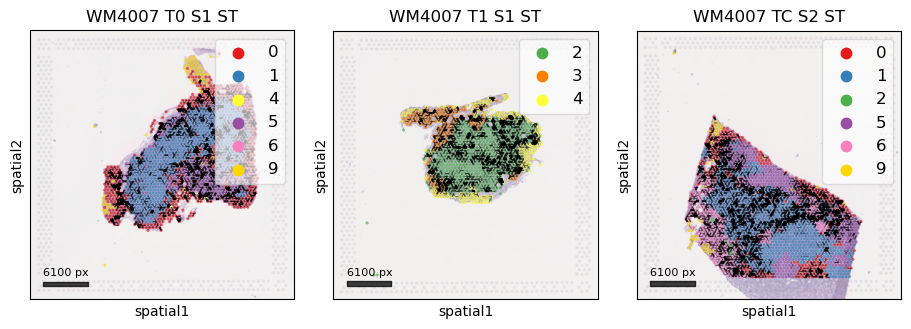

In [23]:
params = dict(fontsize=12, markerscale=1.25, maintainScale=False, linewidth_factor=2.0, alpha=0.65, alpha_img=0.5, decay_power=4, absolute_cutoff=None, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if (('_T0_' in id) and (not '_S2_' in id)) or  (('_T1_' in id) and (not '_S2_' in id)) or (('_TC_' in id) and (not '_S1_' in id))},
                    identity='cluster', palette=palette_rna, f=0.75, nx=3, invert=False, use_raw_distances=False, noplot=False, suptitle=False,  **params)

WM4007_T0_S1_ST	8856 (8856,)
WM4007_T1_S1_ST	5246 (5246,)
WM4007_TC_S2_ST	10594 (10594,)


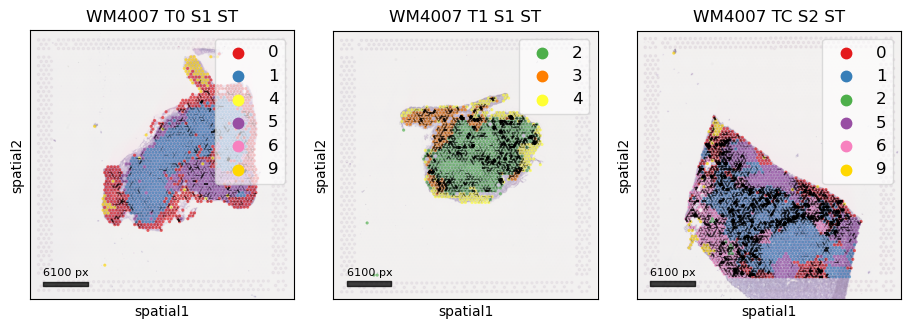

In [33]:
params = dict(fontsize=12, markerscale=1.25, maintainScale=False, linewidth_factor=2.0, alpha=0.65, alpha_img=0.5, decay_power=4, absolute_cutoff=0.8, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if (('_T0_' in id) and (not '_S2_' in id)) or  (('_T1_' in id) and (not '_S2_' in id)) or (('_TC_' in id) and (not '_S1_' in id))},
                    identity='cluster', palette=palette_rna, f=0.75, nx=3, invert=False, use_raw_distances=False, noplot=False, suptitle=False,  **params)

WM4007_T0_S1_ST	WM4007_T1_S1_ST	WM4007_TC_S2_ST	

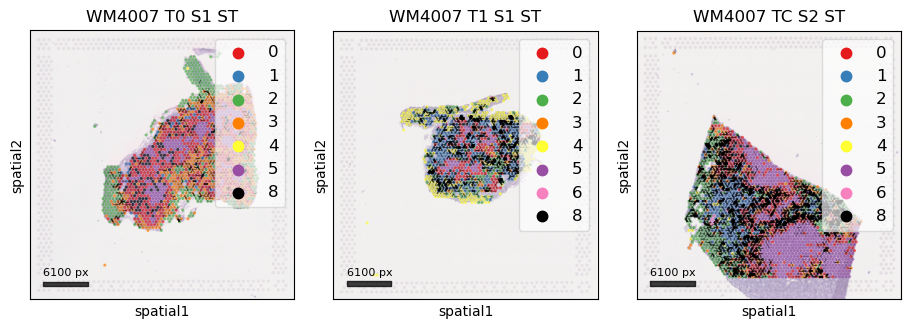

In [36]:
params = dict(fontsize=12, markerscale=1.25, maintainScale=False, linewidth_factor=2.0, alpha=0.65, alpha_img=0.5, decay_power=4, absolute_cutoff=0.8, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if (('_T0_' in id) and (not '_S2_' in id)) or  (('_T1_' in id) and (not '_S2_' in id)) or (('_TC_' in id) and (not '_S1_' in id))},
                    identity='cnv_clusters', palette=palette_rna, f=0.75, nx=3, invert=False, use_raw_distances=False, noplot=False, suptitle=False,  **params)

In [69]:
cnv_palette = {str(i): cm.Set3(c-1) for i, c in enumerate([2,1,7,9,5,11,6,10,8,4,3])}
cnv_palette.update({'T0': '#DE8C00', 'T1': '#7CAE00', 'T2': '#00C08B', 'T3': '#B79F00', 'T4': '#C77CFF', 'TC': '#FF64B0', '-1': 'white'})

In [49]:
from vplot import wrapVplotRatio, wrapVplotScore, wrapVplotGene, vplot

WM4007_T0_S1_ST	WM4007_T1_S1_ST	WM4007_TC_S2_ST	

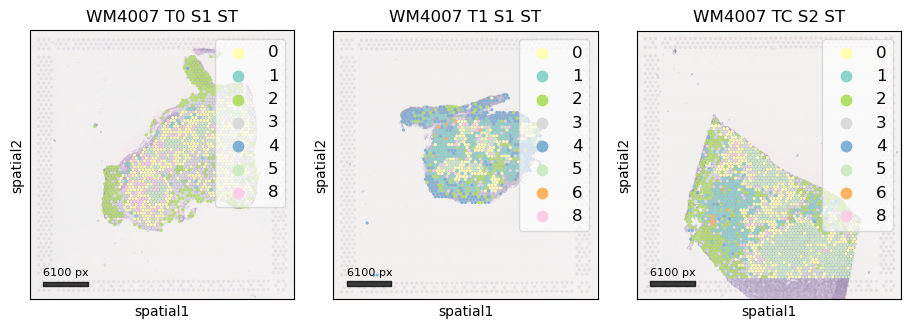

In [71]:
params = dict(fontsize=12, markerscale=1.25, maintainScale=False, linewidth_factor=2.0, alpha=0.95, alpha_img=0.5, decay_power=4, absolute_cutoff=2.0, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if (('_T0_' in id) and (not '_S2_' in id)) or  (('_T1_' in id) and (not '_S2_' in id)) or (('_TC_' in id) and (not '_S1_' in id))},
                    identity='cnv_clusters', palette=cnv_palette, f=0.75, nx=3, invert=False, use_raw_distances=False, noplot=False, suptitle=False,  **params)

WM4007_T0_S1_ST	WM4007_T0_S2_ST	WM4007_T1_S1_ST	WM4007_T1_S2_ST	WM4007_T2_S1_ST	WM4007_T2_S2_ST	WM4007_T3_S1_ST	WM4007_T3_S2_ST	WM4007_T4_S1_ST	WM4007_T4_S2_ST	WM4007_TC_S1_ST	WM4007_TC_S2_ST	

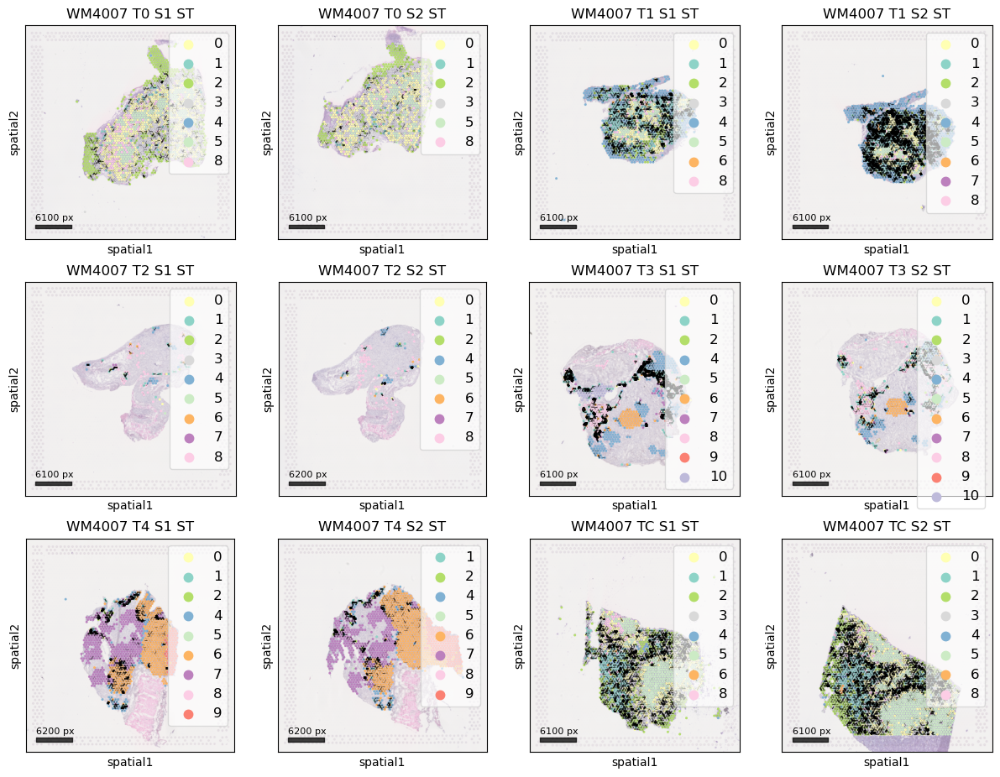

In [72]:
params = dict(fontsize=12, markerscale=1.25, maintainScale=False, linewidth_factor=2.0, alpha=0.95, alpha_img=0.5, decay_power=4, absolute_cutoff=0.8, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge(ads, identity='cnv_clusters', palette=cnv_palette, f=0.75, nx=4, invert=False, use_raw_distances=False, noplot=False, suptitle=False,  **params)

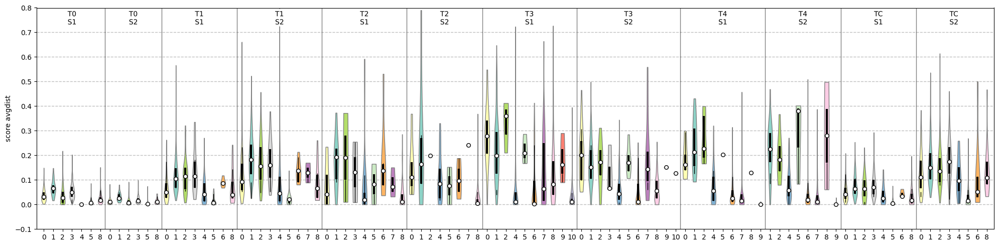

In [73]:
def wrapVplotScoreLoc(score, genesDicts=None, identity=None, selected=[], palette=None, ads=None, ids=None, vprefix='score_', **kwargs):

    if len(selected)==0:
        selected = pd.Series(np.hstack([ads[id].obs[identity] for id in ids])).sort_values().unique().tolist()

    df = pd.concat([pd.Series(ads[id][ads[id].obs[identity].isin(selected), :].obs[vprefix + score].fillna(0).values) for id in ids], keys=ids, axis=1)
    dfc = pd.concat([pd.Series(ads[id][ads[id].obs[identity].isin(selected), :].obs[identity].values.astype(int)) for id in ids], keys=ids, axis=1)
    
    return vplot(df, dfc, name=vprefix + score, palette=palette, **kwargs)

for sample in ids:
    ads[sample].obs['score_avgdist'] = ads[sample].obs['avgdist']
wrapVplotScoreLoc('avgdist', identity='cnv_clusters', palette=cnv_palette, ads=ads, ids=ids, vmin=-0.1)
# wrapVplotScoreLoc('avgdist', identity='cluster', palette=palette_rna, ads=ads, ids=ids)

In [6]:
def sMED(v1, v2):

    """Simple Minimum Event Distance (MED), similar (but not equivalent!) to the one implemented in MEDALT.
    MED is the minimal number and the series of single-copy gains or losses that are required to evolve one genome to another.
    """
    a = v1 - v2
    a = a[np.roll(a, -1) != a]
    a = np.abs(a[a != 0]).sum()
    return int(a)

In [17]:
v1 = np.array([0,0,0,0,1,1,1,1,0,0,0,0,-1,-1,-1,0,0,0,1,1,0,0,0,1])
v2 = np.array([0,0,0,0,0,1,1,0,0,0,0,0,-1,-1,-1,0,0,0,-1,-1,0,0,0,1])
sMED(v1, v2)

4

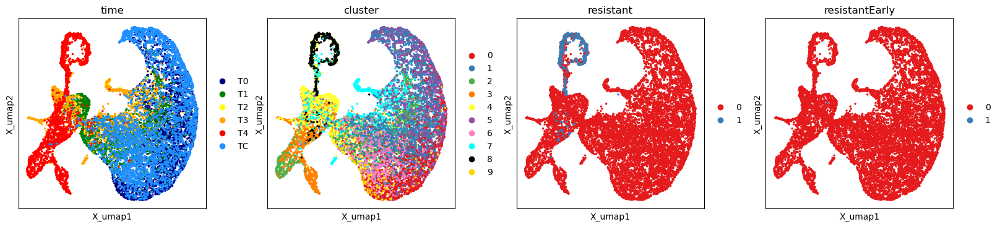

In [15]:
plt.rcParams["figure.figsize"] = (4, 4)
ad_cnv.obs['resistant'] = ((ad_cnv.obs['cluster'].isin(['8'])) & (ad_cnv.obs['time'].isin(['T4']))).astype(int).astype(str).astype('category')
ad_cnv.obs['resistantEarly'] = ((ad_cnv.obs['cluster'].isin(['8'])) & (ad_cnv.obs['time'].isin(['T1', 'T2', 'T3']))).astype(int).astype(str).astype('category')
sc.pl.embedding(ad_cnv, color=['time', 'cluster', 'resistant', 'resistantEarly'], basis="X_umap", palette=palette_rna, size=25)

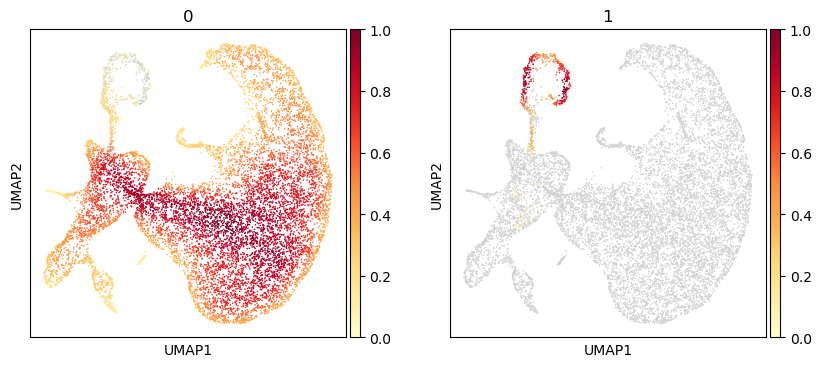

In [13]:
identity = 'resistant'
sc.tl.embedding_density(ad_cnv, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_cnv, groupby=identity, ncols=10, s=5)

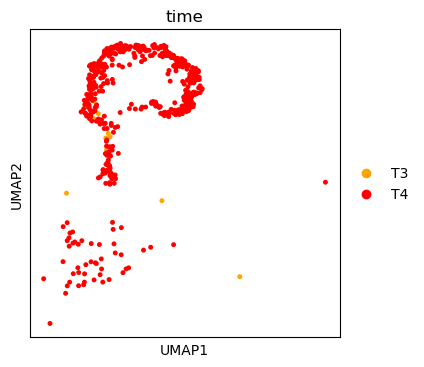

In [24]:
sc.pl.umap(ad_cnv[(ad_cnv.obs['cluster'].isin(['8'])) & (ad_cnv.obs['time'].isin(['T1', 'T2', 'T3', 'T4']))], color='time', s=50)

In [26]:
ad_all = sc.read(dataPath + 'ad_all_human_clustered_st_%s.h5ad' % model)

In [ ]:
ad_all[(ad_all.obs['cluster'].isin(['8'])) & (ad_cnv.obs['time'].isin(['T1', 'T2', 'T3', 'T4']))

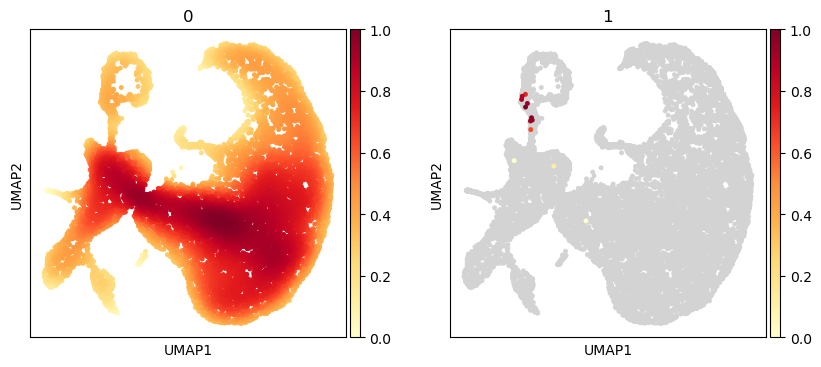

In [19]:
identity = 'resistantEarly'
sc.tl.embedding_density(ad_cnv, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_cnv, groupby=identity, ncols=10, s=50)

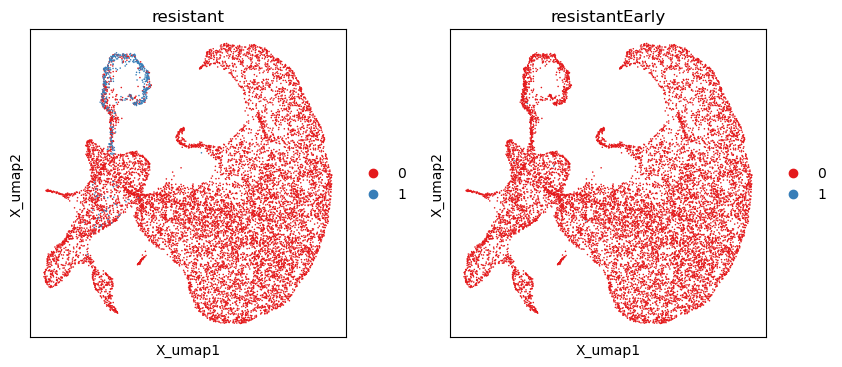

In [17]:
sc.pl.embedding(ad_cnv, color=['resistant', 'resistantEarly'], basis="X_umap", palette=palette_rna, size=5)

# Load images and create ADs

In [5]:
images = {id: [(ad_temp := sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id)).uns['spatial'], ad_temp.obs.index, ad_temp.obsm['spatial']] for id in ids}

In [6]:
ads = dict()
for sample in ids:
    print(sample, end='\t')
    ads[sample] = ad_cnv[ad_cnv.obs['id']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample][0]
    ads[sample].obsm['spatial'] = pd.DataFrame(index=images[sample][1], data=images[sample][2]).reindex(ads[sample].obs['original_barcode']).values
    ads[sample][:, :] = filterCNV(ads[sample].to_df().T, n=10).T

WM4007_T0_S1_ST	WM4007_T0_S2_ST	WM4007_T1_S1_ST	WM4007_T1_S2_ST	WM4007_T2_S1_ST	WM4007_T2_S2_ST	WM4007_T3_S1_ST	WM4007_T3_S2_ST	WM4007_T4_S1_ST	WM4007_T4_S2_ST	WM4007_TC_S1_ST	WM4007_TC_S2_ST	

In [7]:
# plotSpatialAll(ads, identity='cnv_clusters', palette=palette_rna, f=0.75)

In [8]:
# plotSpatialAll(ads, identity='cluster', palette=palette_rna, f=0.75)

In [9]:
# params = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=2, absolute_cutoff=60, method='MED', alpha_quantile=0.75, cacheEdges=True)
#
# # plotSpatialEdge({(id:='WM4007_T0_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params)
# # plotSpatialEdge({(id:='WM4007_T1_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params)
# # plotSpatialEdge({(id:='WM4007_T3_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params)
# plotSpatialEdge({(id:='WM4007_T4_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params)

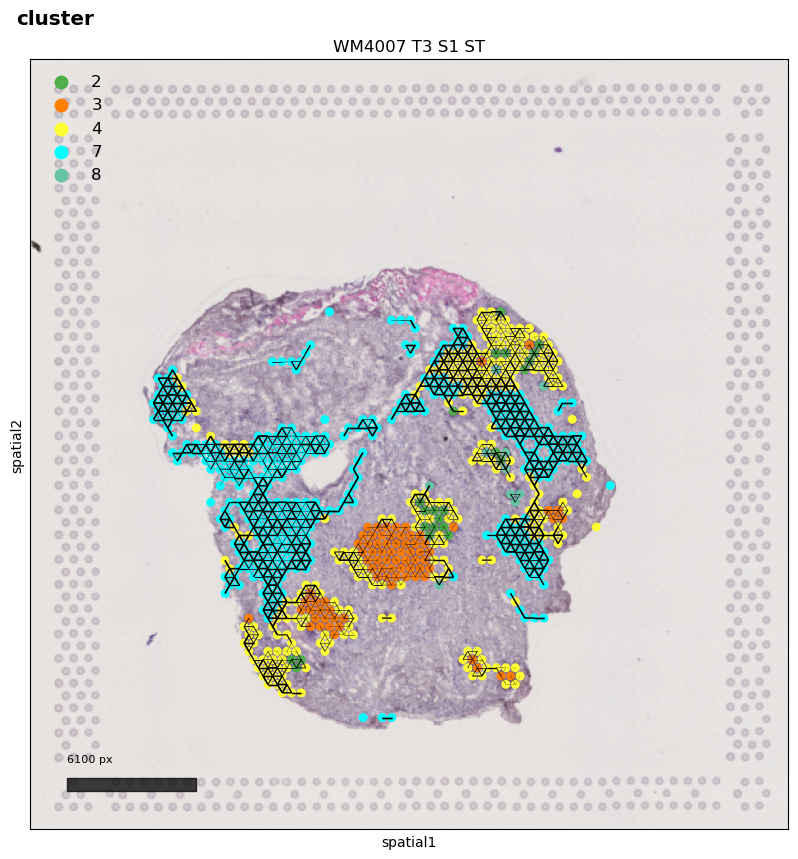

In [10]:
params2 = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=1,
               absolute_cutoff=0.4, alpha_quantile=0.75, method='pearson', cacheEdges=False) # 70

# plotSpatialEdge({(id:='WM4007_T0_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params2)
# plotSpatialEdge({(id:='WM4007_T1_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params2)
# plotSpatialEdge({(id:='WM4007_T2_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params2)
df_info = plotSpatialEdge({(id:='WM4007_T3_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params2)
# plotSpatialEdge({(id:='WM4007_T4_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params2)
# plotSpatialEdge({(id:='WM4007_TC_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=2, invert=False, **params2)

In [11]:
ad = ads['WM4007_T3_S1_ST']
ad

AnnData object with n_obs × n_vars = 710 × 8625
    obs: 'sample', 'cluster', 'time', 'original_barcode', 'id', 'cnv_clusters'
    uns: 'cluster_colors', 'cnv_clusters_colors', 'leiden', 'neighbors', 'pca', 'sample_colors', 'time_colors', 'umap', 'spatial'
    obsm: 'X_palantir', 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [12]:
# cplot(ad.to_df().T, ad.obs[['time', 'cluster']], palette=palette_rna)

In [13]:
# df_temp, df_meta_temp = df_all.loc[df_all.index.intersection(genesDicts['PID_HIF1_TFPATHWAY'])], df_meta[['time', 'cluster']] # .sort_values(by=['cluster', 'time'], ascending=False)
# cplot(df_temp[df_meta_temp.index], df_meta_temp, palette=palette1, clusterVar=True, clusterObs=True, addGeneLabels=True, fontsizeGeneLabels=10, addLinesOnHeatmap=True);

After filtering: (8625, 700)
Using sMED


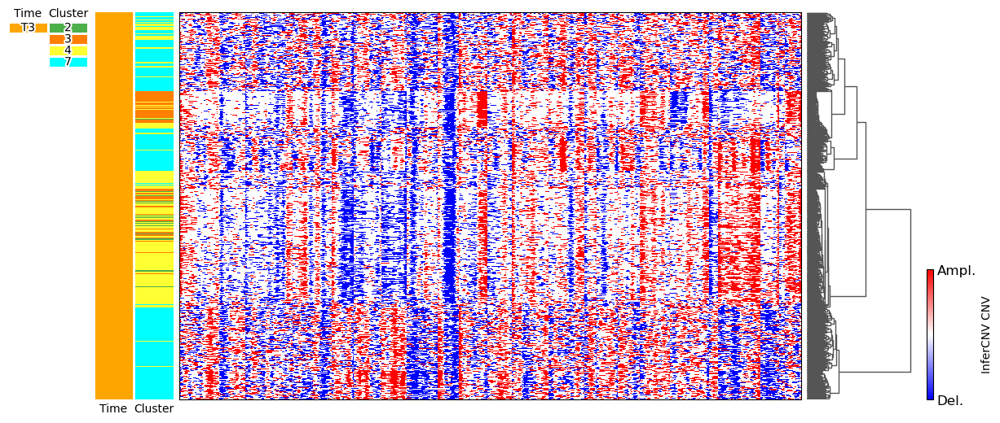

In [27]:
df_temp, df_meta_temp = ad.to_df().T, ad.obs[['time', 'cluster']].sort_values(by=['time', 'cluster'], ascending=False)
df_temp = df_temp[df_meta_temp.index]
cplot(df_temp, df_meta_temp, sampleMED=1000, clusterObsByGroups=False, optimalOrderingForObs=False,
            palette=palette_rna, clusterVar=False, clusterObs=True, addLinesOnHeatmap=False, addLinesOnGroups=False, useMEDforObsGroups=True, useMEDforObs=True,
            colorbarLabel='InferCNV CNV', colorbarLabels=['Ampl.', 'Del.'], safetyLimit=2000, figsize=[14,8], dendrogramLineWidth=1.0);

In [54]:
dataPath = '../../data/'
dfc_WM4007 = sc.read(dataPath + 'ad_all_scaled_unfiltered_st_WM4007.h5ad').obs.set_index(['T', 'sample'])['in_tissue'].groupby(level=[0,1]).count().replace(0, np.nan).dropna()
dfc_WM4007_h = sc.read(dataPath + 'ad_all_human_clustered_st_WM4007.h5ad').obs.set_index(['T', 'sample'])['in_tissue'].groupby(level=[0,1]).count().replace(0, np.nan).dropna()

# dfc_WM4237 = sc.read(dataPath + 'ad_all_scaled_unfiltered_st_WM4237.h5ad').obs.set_index(['T', 'sample'])['in_tissue'].groupby(level=[0,1]).count().replace(0, np.nan).dropna()
# dfc_WM4237_h = sc.read(dataPath + 'ad_all_human_clustered_st_WM4237.h5ad').obs.set_index(['T', 'sample'])['in_tissue'].groupby(level=[0,1]).count().replace(0, np.nan).dropna()

# dfc_WM4007, dfc_WM4007_h, dfc_WM4237, dfc_WM4237_h

(T   sample         
 T0  WM4007_T0_S1_ST    1661.0
     WM4007_T0_S2_ST    1293.0
 T1  WM4007_T1_S1_ST    1044.0
     WM4007_T1_S2_ST    1103.0
 T2  WM4007_T2_S1_ST    1175.0
     WM4007_T2_S2_ST    1134.0
 T3  WM4007_T3_S1_ST    1935.0
     WM4007_T3_S2_ST    1808.0
 T4  WM4007_T4_S1_ST    1574.0
     WM4007_T4_S2_ST    1960.0
 TC  WM4007_TC_S1_ST    1580.0
     WM4007_TC_S2_ST    1843.0
 Name: in_tissue, dtype: float64,
 T   sample         
 T0  WM4007_T0_S1_ST    1577.0
     WM4007_T0_S2_ST    1208.0
 T1  WM4007_T1_S1_ST     962.0
     WM4007_T1_S2_ST    1027.0
 T2  WM4007_T2_S1_ST     157.0
     WM4007_T2_S2_ST     117.0
 T3  WM4007_T3_S1_ST     714.0
     WM4007_T3_S2_ST     576.0
 T4  WM4007_T4_S1_ST     963.0
     WM4007_T4_S2_ST    1266.0
 TC  WM4007_TC_S1_ST    1580.0
     WM4007_TC_S2_ST    1843.0
 Name: in_tissue, dtype: float64,
 T   sample         
 T0  WM4237_T0_S1_ST    2692.0
     WM4237_T0_S2_ST    2493.0
 T1  WM4237_T1_S1_ST     288.0
     WM4237_T1_S2_ST     314.0
 

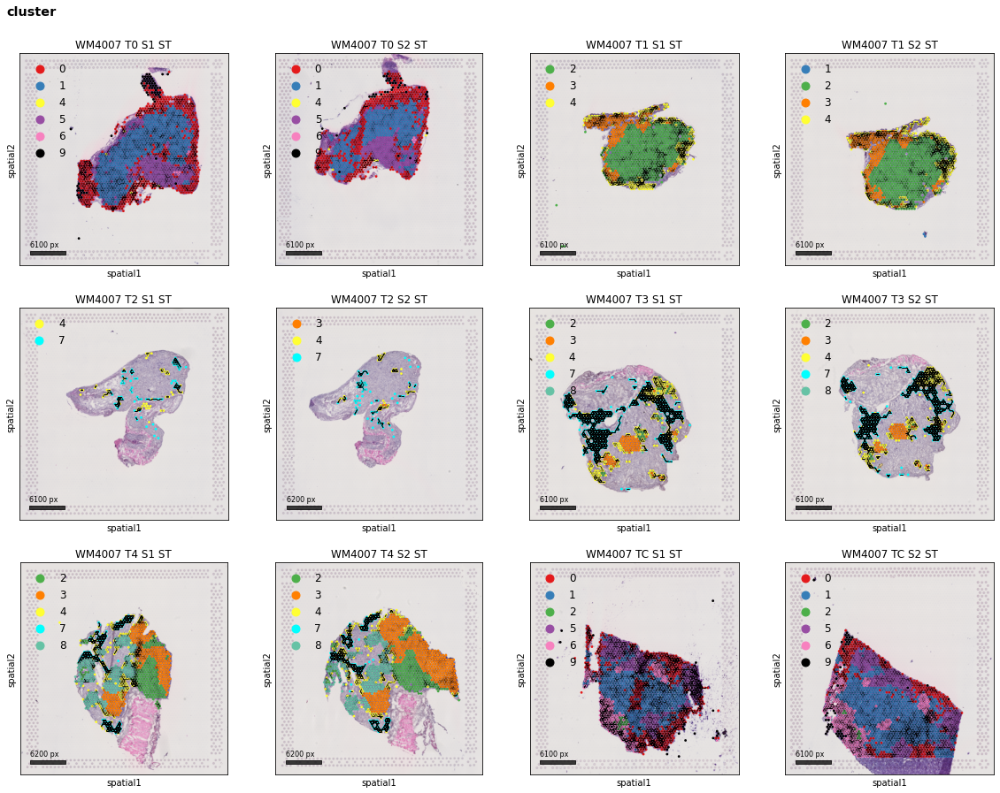

In [322]:
params2 = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=2, absolute_cutoff=70, alpha_quantile=0.75, method='MED', cacheEdges=False)

plotSpatialEdge(ads, identity='cluster', palette=palette_rna, f=1., invert=False, **params2)

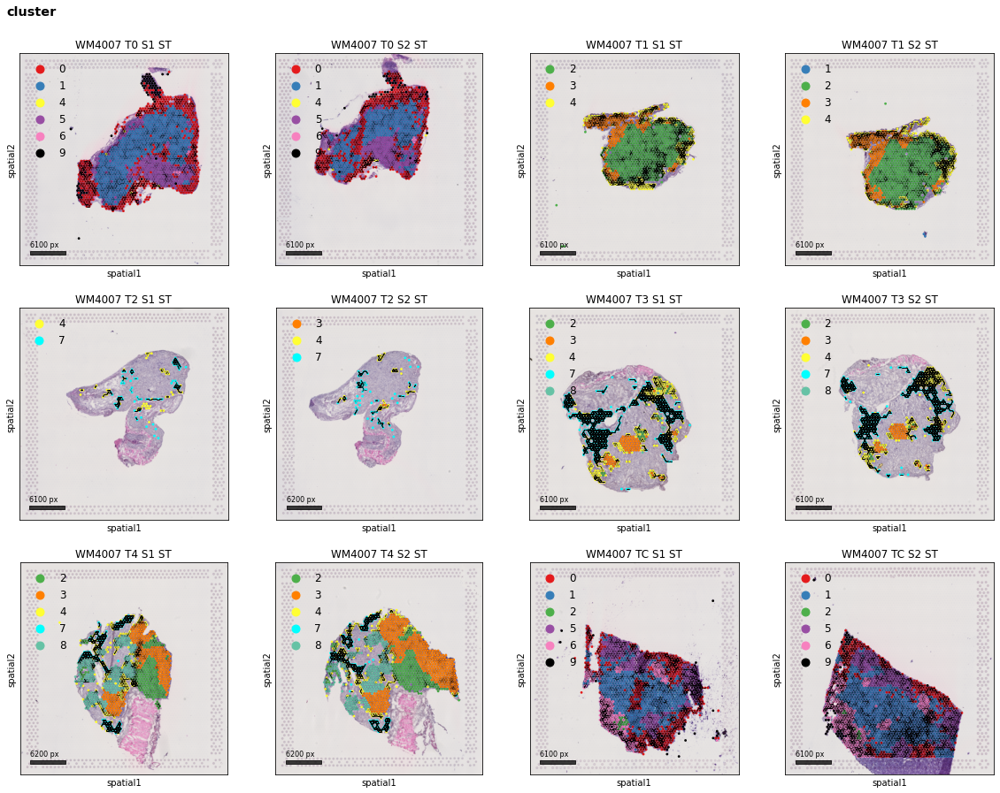

In [320]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=2, absolute_cutoff=70, method='MED', alpha_quantile=0.75, cacheEdges=True)

plotSpatialEdge(ads, identity='cluster', palette=palette_rna, f=1., invert=False, **params)